In [28]:
import pandas as pd
mport ydata_profiling
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

# setting up styles for visualizations
sns.set(style="whitegrid")

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import SMOTE
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, classification_report
from pandas_profiling import ProfileReport
from sklearn.model_selection import cross_val_score

C:\Users\modcom\AppData\Local\Temp\ipykernel_4020\3808965296.py:15: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [8]:
# Loading the dataset
file_path = 'E:\Data Science Boot Camp\DS Cohort 4 ML\Assignment 3 ML\Hotel Reservations.csv'
df = pd.read_csv(file_path)

# Displaying the first few rows of the dataset to understand its structure
df.head()

,Booking_ID,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,INN00001,2,0,1,2,Meal Plan 1,0,Room_Type 1,224,2017,10,2,Offline,0,0,0,65.00,0,Not_Canceled
1,INN00002,2,0,2,3,Not Selected,0,Room_Type 1,5,2018,11,6,Online,0,0,0,106.68,1,Not_Canceled
2,INN00003,1,0,2,1,Meal Plan 1,0,Room_Type 1,1,2018,2,28,Online,0,0,0,60.00,0,Canceled
3,INN00004,2,0,0,2,Meal Plan 1,0,Room_Type 1,211,2018,5,20,Online,0,0,0,100.00,0,Canceled
4,INN00005,2,0,1,1,Not Selected,0,Room_Type 1,48,2018,4,11,Online,0,0,0,94.50,0,Canceled


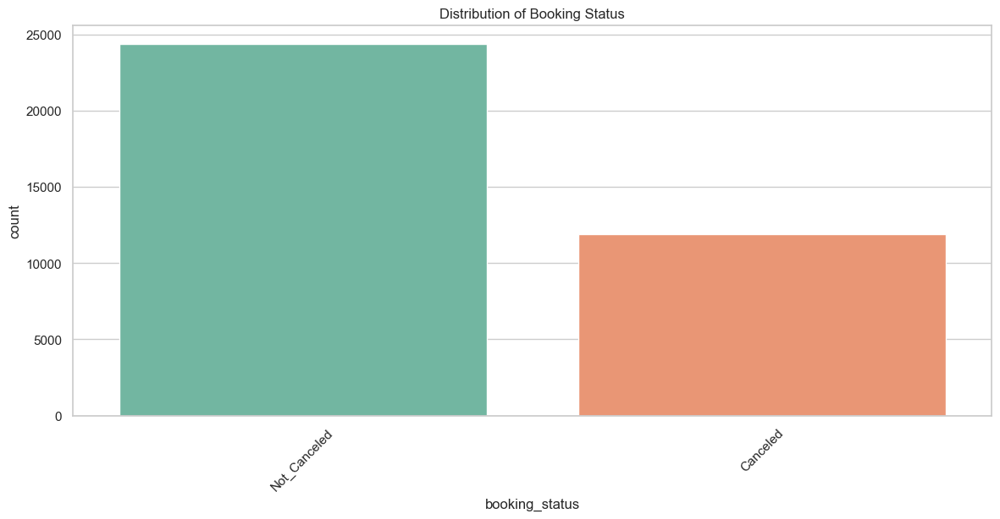

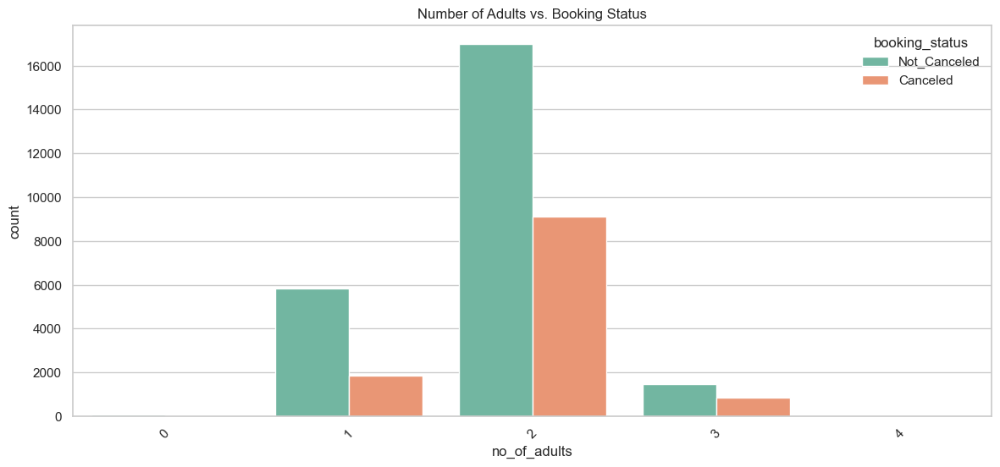

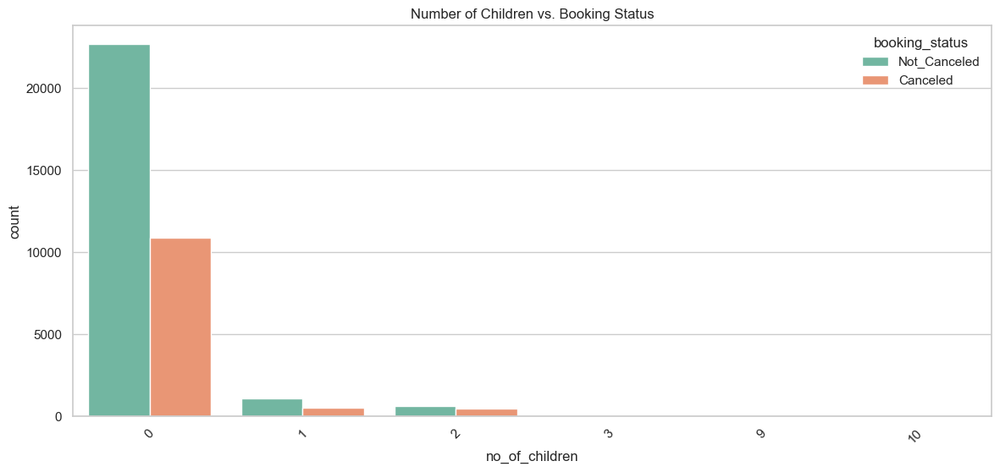

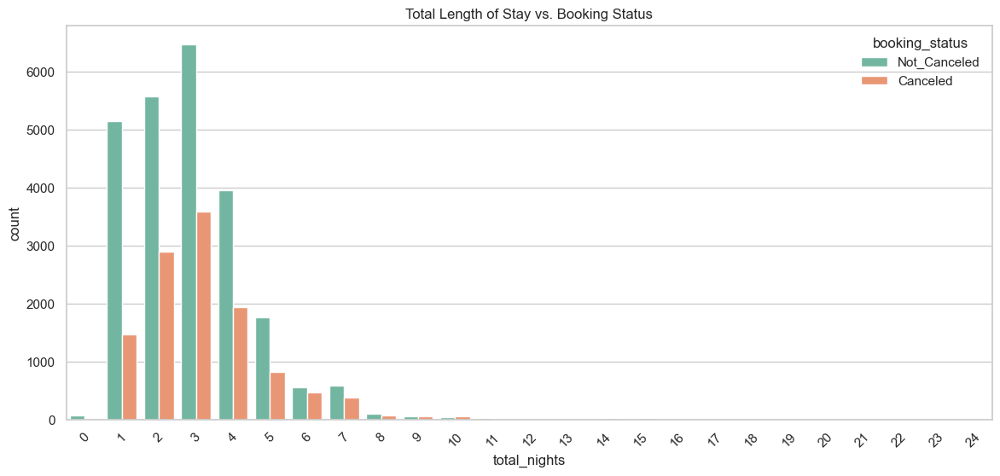

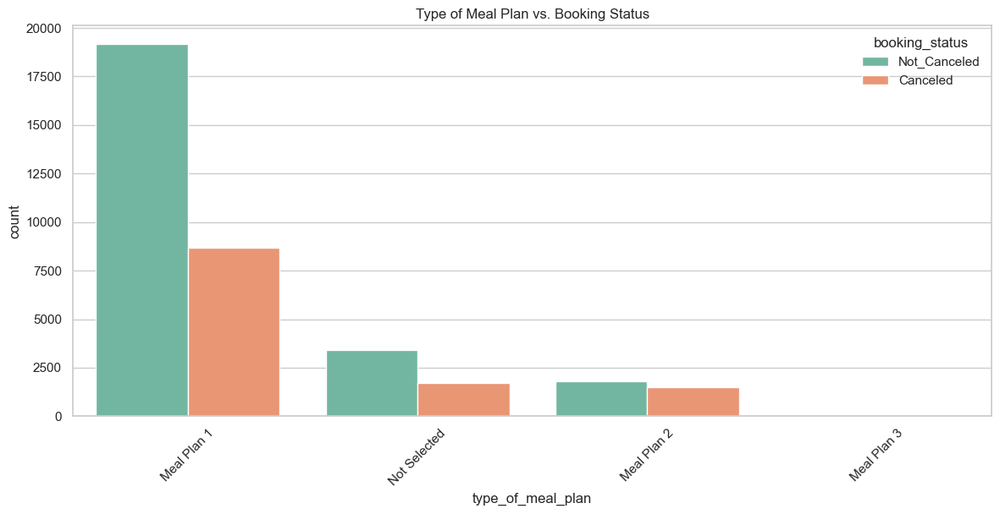

...

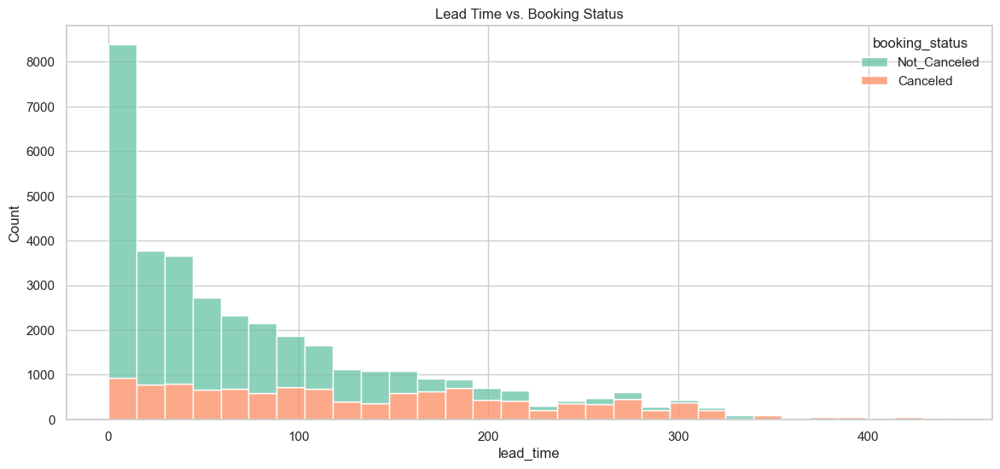

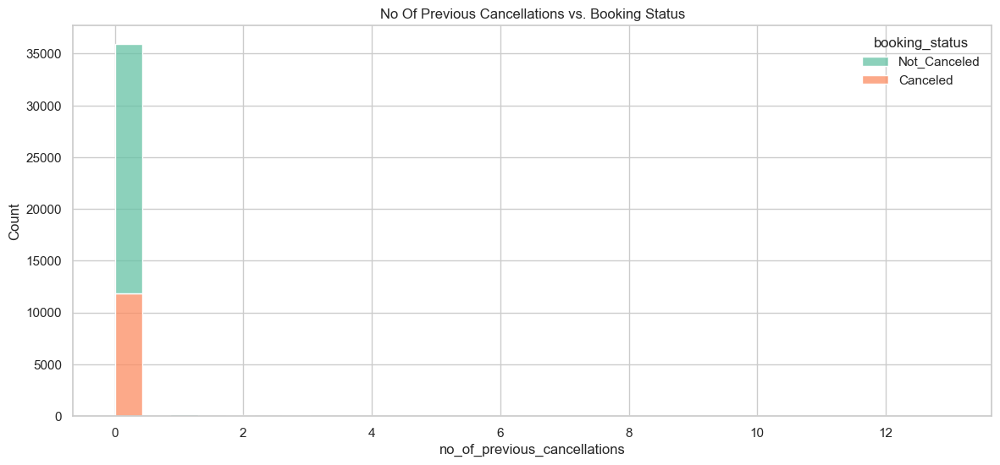

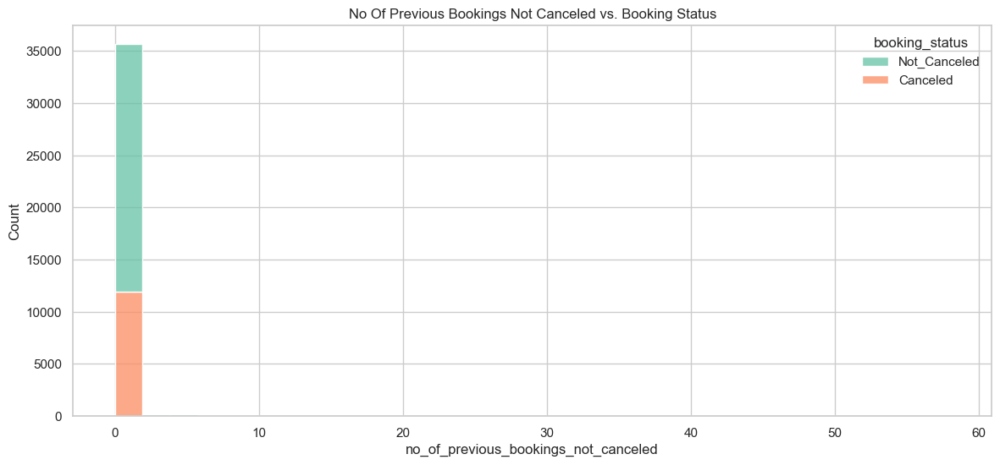

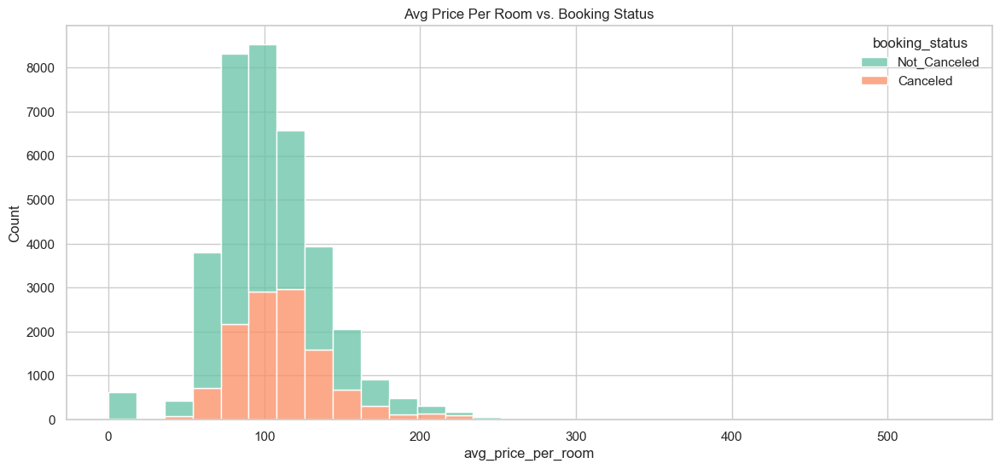

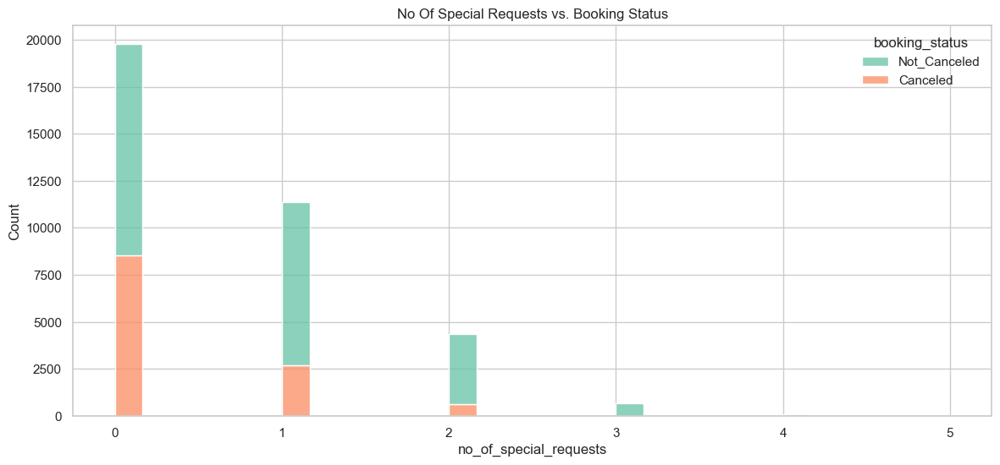

In [9]:
# Create a new column for total nights
df['total_nights'] = df['no_of_weekend_nights'] + df['no_of_week_nights']

# Set up the visualization environment
sns.set(style="whitegrid")
plt.rcParams["figure.figsize"] = (14, 6)

# Function to create a count plot for categorical variables
def plot_count(data, column, title, hue=None):
    plt.figure()
    sns.countplot(x=column, data=data, hue=hue, palette='Set2')
    plt.title(title)
    plt.xticks(rotation=45)
    plt.show()

# Plotting all the visualizations
plot_count(df, 'booking_status', 'Distribution of Booking Status')
plot_count(df, 'no_of_adults', 'Number of Adults vs. Booking Status', hue='booking_status')
plot_count(df, 'no_of_children', 'Number of Children vs. Booking Status', hue='booking_status')
plot_count(df, 'total_nights', 'Total Length of Stay vs. Booking Status', hue='booking_status')
plot_count(df, 'type_of_meal_plan', 'Type of Meal Plan vs. Booking Status', hue='booking_status')
plot_count(df, 'required_car_parking_space', 'Car Parking Space Requirement vs. Booking Status', hue='booking_status')
plot_count(df, 'room_type_reserved', 'Room Type Reserved vs. Booking Status', hue='booking_status')
plot_count(df, 'arrival_month', 'Monthly Booking Status', hue='booking_status')
plot_count(df, 'arrival_date', 'Arrival Date vs. Booking Status', hue='booking_status')
plot_count(df, 'market_segment_type', 'Market Segment Type vs. Booking Status', hue='booking_status')
plot_count(df, 'repeated_guest', 'Repeated Guest vs. Booking Status', hue='booking_status')

# Plotting histograms for numerical data
numerical_columns = ['lead_time', 'no_of_previous_cancellations', 'no_of_previous_bookings_not_canceled', 'avg_price_per_room', 'no_of_special_requests']
for column in numerical_columns:
    plt.figure()
    sns.histplot(data=df, x=column, hue='booking_status', multiple='stack', bins=30, palette='Set2')
    plt.title(f'{column.replace("_", " ").title()} vs. Booking Status')
    plt.show()


In [59]:
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Function to create and save a count plot for categorical variables
def plot_and_save_count(data, column, title, hue=None, directory="E:\Data Science Boot Camp\DS Cohort 4 ML\Assignment 3 ML\plots"):
    plt.figure()
    sns.countplot(x=column, data=data, hue=hue, palette='Set2')
    plt.title(title)
    plt.xticks(rotation=45)

    # Check if directory exists, if not, create it
    if not os.path.exists(directory):
        os.makedirs(directory)

    # Save the plot
    plt.savefig(f"{directory}/{column}.png")
    plt.close()

# Set up the visualization environment
sns.set(style="whitegrid")
plt.rcParams["figure.figsize"] = (14, 6)

# Plotting and saving all the count visualizations
plot_and_save_count(df, 'booking_status', 'Distribution of Booking Status')
plot_and_save_count(df, 'no_of_adults', 'Number of Adults vs. Booking Status', hue='booking_status')
plot_and_save_count(df, 'no_of_children', 'Number of Children vs. Booking Status', hue='booking_status')
plot_and_save_count(df, 'total_nights', 'Total Length of Stay vs. Booking Status', hue='booking_status')
plot_and_save_count(df, 'type_of_meal_plan', 'Type of Meal Plan vs. Booking Status', hue='booking_status')
plot_and_save_count(df, 'required_car_parking_space', 'Car Parking Space Requirement vs. Booking Status', hue='booking_status')
plot_and_save_count(df, 'room_type_reserved', 'Room Type Reserved vs. Booking Status', hue='booking_status')
plot_and_save_count(df, 'arrival_month', 'Monthly Booking Status', hue='booking_status')
plot_and_save_count(df, 'arrival_date', 'Arrival Date vs. Booking Status', hue='booking_status')
plot_and_save_count(df, 'market_segment_type', 'Market Segment Type vs. Booking Status', hue='booking_status')
plot_and_save_count(df, 'repeated_guest', 'Repeated Guest vs. Booking Status', hue='booking_status')

# Plotting and saving histograms for numerical data
numerical_columns = ['lead_time', 'no_of_previous_cancellations', 'no_of_previous_bookings_not_canceled', 'avg_price_per_room', 'no_of_special_requests']
for column in numerical_columns:
    plt.figure()
    sns.histplot(data=df, x=column, hue='booking_status', multiple='stack', bins=30)
    plt.title(f'{column.replace("_", " ").title()} vs. Booking Status')
    
    # Save the plot
    plt.savefig(f'E:\Data Science Boot Camp\DS Cohort 4 ML\Assignment 3 ML\plots\{column}.png')
    plt.close()

In [10]:
from ydata_profiling import ProfileReport

profile = ProfileReport(df)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:02<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36275 entries, 0 to 36274
Data columns (total 20 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Booking_ID                            36275 non-null  object 
 1   no_of_adults                          36275 non-null  int64  
 2   no_of_children                        36275 non-null  int64  
 3   no_of_weekend_nights                  36275 non-null  int64  
 4   no_of_week_nights                     36275 non-null  int64  
 5   type_of_meal_plan                     36275 non-null  object 
 6   required_car_parking_space            36275 non-null  int64  
 7   room_type_reserved                    36275 non-null  object 
 8   lead_time                             36275 non-null  int64  
 9   arrival_year                          36275 non-null  int64  
 10  arrival_month                         36275 non-null  int64  
 11  arrival_date   

In [17]:
df=df.drop(columns=['Booking_ID'])

In [18]:
df.head(2)

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status,total_nights
0,2,0,1,2,Meal Plan 1,0,Room_Type 1,224,2017,10,2,Offline,0,0,0,65.00,0,Not_Canceled,3
1,2,0,2,3,Not Selected,0,Room_Type 1,5,2018,11,6,Online,0,0,0,106.68,1,Not_Canceled,5


In [19]:
# Applying label encoding to the specified categorical columns
from sklearn.preprocessing import LabelEncoder

# Creating a copy of the dataframe for preprocessing
df_data = df.copy()

# Specified categorical columns
specified_categorical_columns = ['type_of_meal_plan', 'booking_status', 'market_segment_type', 'room_type_reserved']

# Applying Label Encoding
label_encoders = {}
for column in specified_categorical_columns:
    label_encoders[column] = LabelEncoder()
    df_data[column] = label_encoders[column].fit_transform(df[column])

# Displaying the transformed dataframe with encoded specified categorical columns
df_data[specified_categorical_columns].head()


,type_of_meal_plan,booking_status,market_segment_type,room_type_reserved
0,0,1,3,0
1,3,1,4,0
2,0,0,4,0
3,0,0,4,0
4,3,0,4,0


In [23]:
df_data

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status,total_nights
0,2,0,1,2,0,0,0,224,2017,10,2,3,0,0,0,65.00,0,1,3
1,2,0,2,3,3,0,0,5,2018,11,6,4,0,0,0,106.68,1,1,5
2,1,0,2,1,0,0,0,1,2018,2,28,4,0,0,0,60.00,0,0,3
3,2,0,0,2,0,0,0,211,2018,5,20,4,0,0,0,100.00,0,0,2
4,2,0,1,1,3,0,0,48,2018,4,11,4,0,0,0,94.50,0,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36270,3,0,2,6,0,0,3,85,2018,8,3,4,0,0,0,167.80,1,1,8
36271,2,0,1,3,0,0,0,228,2018,10,17,4,0,0,0,90.95,2,0,4
36272,2,0,2,6,0,0,0,148,2018,7,1,4,0,0,0,98.39,2,1,8
36273,2,0,0,3,3,0,0,63,2018,4,21,4,0,0,0,94.50,0,0,3


In [25]:
df_data=df_data.drop(columns=['total_nights'])

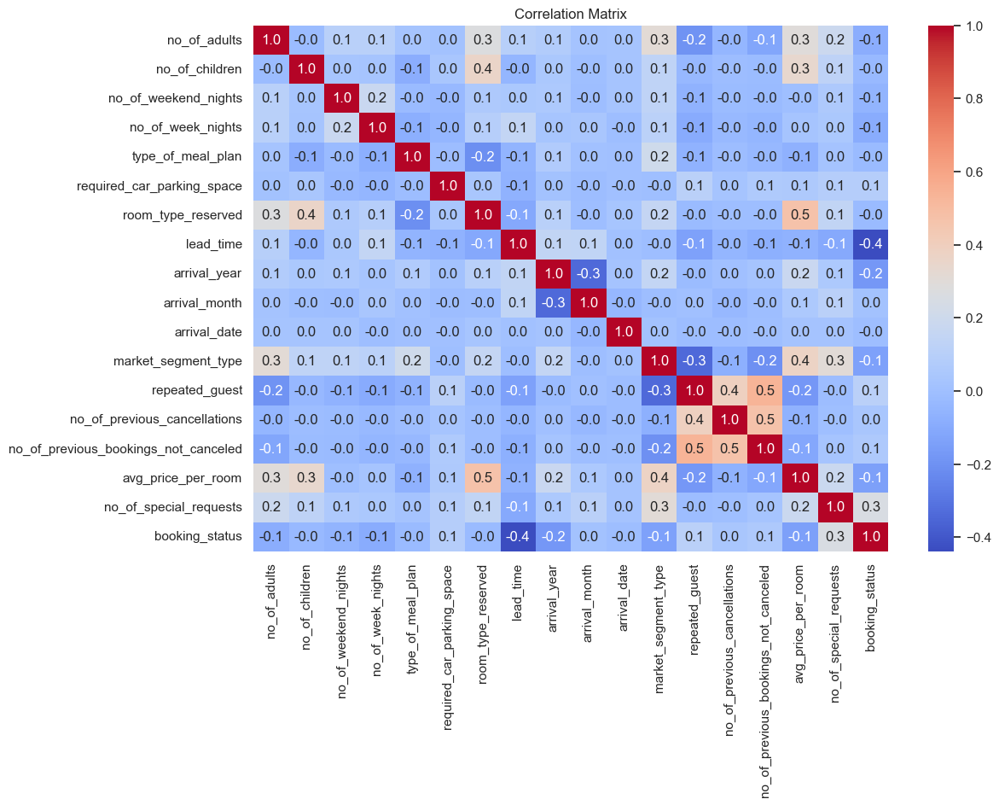

In [60]:
import seaborn as sns

# Correlation matrix
correlation_matrix = df_data.corr()

# Plotting the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".1f")
plt.title('Correlation Matrix')
plt.savefig(f'E:\Data Science Boot Camp\DS Cohort 4 ML\Assignment 3 ML\Correlation Matrix.png')
plt.show()


In [32]:

X = df_data.drop('booking_status', axis=1)
y =df_data['booking_status']

scaler = StandardScaler()
scaler.fit(X)
scaled_data = scaler.transform(X)
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(scaled_data, y, test_size=0.2, random_state=42)


In [38]:
# Initialize and train the Decision Tree Classifier
dt_classifier = DecisionTreeClassifier(random_state=42)
dt_classifier.fit(X_train, y_train)

# Predict on the test set
y_pred_dt = dt_classifier.predict(X_test)



knn_classifier = KNeighborsClassifier(n_neighbors=1)
knn_classifier.fit(X_train, y_train)

# Predict on the test set
y_pred_knn = knn_classifier.predict(X_test)

In [39]:
# Decision Tree Evaluation
print("Decision Tree Evaluation")
print("Accuracy:", accuracy_score(y_test, y_pred_dt))
print(classification_report(y_test, y_pred_dt))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_dt))

# KNN Evaluation
print("\nKNN Evaluation")
print("Accuracy:", accuracy_score(y_test, y_pred_knn))
print(classification_report(y_test, y_pred_knn))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_knn))

Decision Tree Evaluation
Accuracy: 0.8698828394210889
              precision    recall  f1-score   support

           0       0.80      0.81      0.81      2416
           1       0.91      0.90      0.90      4839

    accuracy                           0.87      7255
   macro avg       0.85      0.86      0.85      7255
weighted avg       0.87      0.87      0.87      7255

Confusion Matrix:
[[1969  447]
 [ 497 4342]]

KNN Evaluation
Accuracy: 0.8537560303239146
              precision    recall  f1-score   support

           0       0.78      0.78      0.78      2416
           1       0.89      0.89      0.89      4839

    accuracy                           0.85      7255
   macro avg       0.84      0.84      0.84      7255
weighted avg       0.85      0.85      0.85      7255

Confusion Matrix:
[[1890  526]
 [ 535 4304]]


In [40]:
#Training Accuracy
print(knn_classifier.score(X_train, y_train))

0.9925223983459683


In [41]:

print(knn_classifier.score(X_test, y_test))

0.8537560303239146


In [42]:
dt_gini = DecisionTreeClassifier(criterion='gini', random_state=42)
dt_gini.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [43]:
y_pred_gini = dt_gini.predict(X_test)

accuracy_gini = accuracy_score(y_test, y_pred_gini)

accuracy_gini

0.8698828394210889

In [45]:
dt_entropy = DecisionTreeClassifier(criterion='entropy', random_state=42)
dt_entropy.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', random_state=42)

In [46]:
y_pred_entropy = dt_entropy.predict(X_test)

accuracy_entropy = accuracy_score(y_test, y_pred_entropy)

accuracy_entropy

0.8729152308752585

Gini Model Evaluation Metrics:
Confusion Matrix:
 [[1969  447]
 [ 497 4342]]
Precision: 0.91
Recall: 0.90
F1 Score: 0.90
ROC AUC: 0.86

Entropy Model Evaluation Metrics:
Confusion Matrix:
 [[1965  451]
 [ 471 4368]]
Precision: 0.91
Recall: 0.90
F1 Score: 0.90
ROC AUC: 0.86


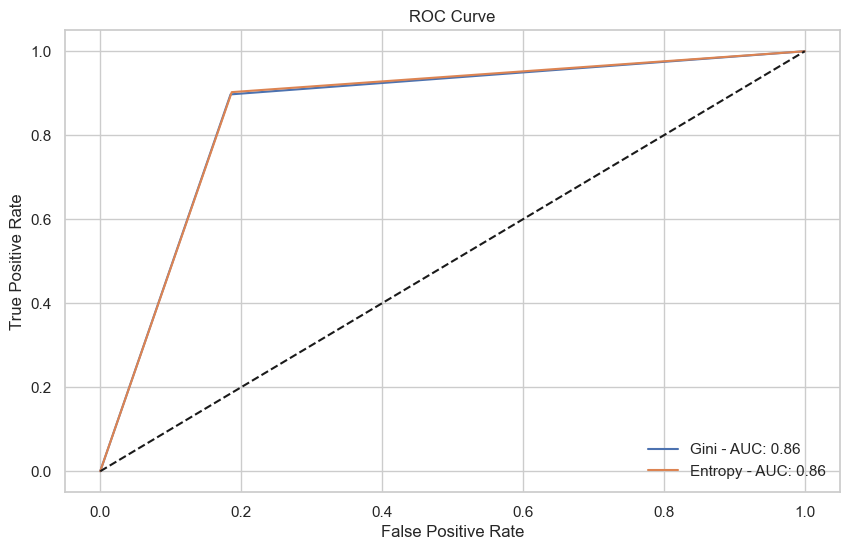

In [61]:
# Evaluation metrics for Gini model
confusion_gini = confusion_matrix(y_test, y_pred_gini)
precision_gini = precision_score(y_test, y_pred_gini)
recall_gini = recall_score(y_test, y_pred_gini)
f1_score_gini = f1_score(y_test, y_pred_gini)
roc_auc_gini = roc_auc_score(y_test, y_pred_gini)

# Evaluation metrics for Entropy model
confusion_entropy = confusion_matrix(y_test, y_pred_entropy)
precision_entropy = precision_score(y_test, y_pred_entropy)
recall_entropy = recall_score(y_test, y_pred_entropy)
f1_score_entropy = f1_score(y_test, y_pred_entropy)
roc_auc_entropy = roc_auc_score(y_test, y_pred_entropy)

# Printing the evaluation metrics
print("Gini Model Evaluation Metrics:")
print("Confusion Matrix:\n", confusion_gini)
print("Precision: {:.2f}".format(precision_gini))
print("Recall: {:.2f}".format(recall_gini))
print("F1 Score: {:.2f}".format(f1_score_gini))
print("ROC AUC: {:.2f}".format(roc_auc_gini))

print("\nEntropy Model Evaluation Metrics:")
print("Confusion Matrix:\n", confusion_entropy)
print("Precision: {:.2f}".format(precision_entropy))
print("Recall: {:.2f}".format(recall_entropy))
print("F1 Score: {:.2f}".format(f1_score_entropy))
print("ROC AUC: {:.2f}".format(roc_auc_entropy))

# ROC curve calculations
fpr_gini, tpr_gini, _ = roc_curve(y_test, y_pred_gini)
fpr_entropy, tpr_entropy, _ = roc_curve(y_test, y_pred_entropy)

# Plotting ROC curves
plt.figure(figsize=(10, 6))
plt.plot(fpr_gini, tpr_gini, label='Gini - AUC: {:.2f}'.format(roc_auc_gini))
plt.plot(fpr_entropy, tpr_entropy, label='Entropy - AUC: {:.2f}'.format(roc_auc_entropy))
plt.plot([0, 1], [0, 1], 'k--') # Dashed diagonal line
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.savefig(f'E:\Data Science Boot Camp\DS Cohort 4 ML\Assignment 3 ML\ROC_DT.png')
plt.show()

lead_time: 0.3229430902580772
avg_price_per_room: 0.16515640490180766
no_of_special_requests: 0.09986692890126185
arrival_date: 0.09165167466047243
arrival_month: 0.07846477053417217
market_segment_type: 0.05577042940622923
no_of_week_nights: 0.05067503902378554
no_of_weekend_nights: 0.036909764234742064
no_of_adults: 0.0241500548762041
arrival_year: 0.023348824165137328
type_of_meal_plan: 0.018441027322195054
room_type_reserved: 0.015005293472304513
no_of_children: 0.006842361366796364
required_car_parking_space: 0.006663100006647253
repeated_guest: 0.0025857513527480507
no_of_previous_bookings_not_canceled: 0.0012031947319811299
no_of_previous_cancellations: 0.00032229078543807307


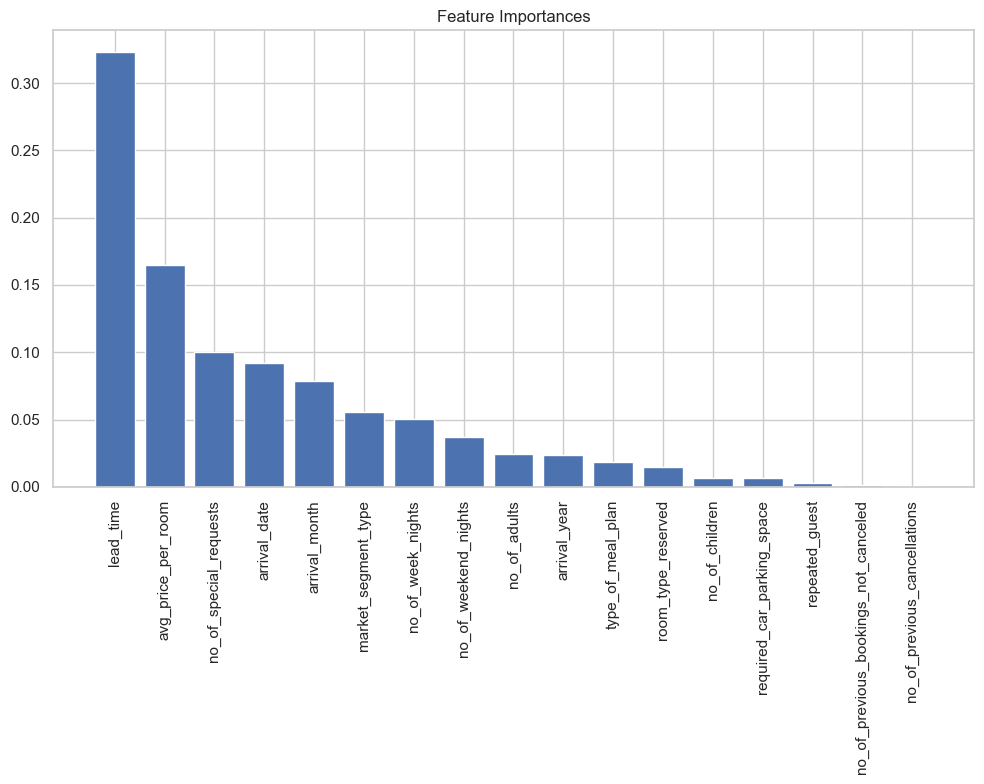

In [48]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

# Assuming df is your dataframe and 'target' is your target column
X = df_data.drop('booking_status', axis=1)
y = df_data['booking_status']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the Random Forest Classifier
rf = RandomForestClassifier(n_estimators=100, random_state=42)

# Fit the model
rf.fit(X_train, y_train)

# Get feature importances
importances = rf.feature_importances_

# Sort the feature importances in descending order and match with column names
sorted_indices = importances.argsort()[::-1]
sorted_importances = importances[sorted_indices]
sorted_features = X.columns[sorted_indices]

# Print the feature importances
for feature, importance in zip(sorted_features, sorted_importances):
    print(f"{feature}: {importance}")

# Optionally, you can convert the sorted features and their importances to a DataFrame
import pandas as pd
feature_importance_df = pd.DataFrame({
    'Feature': sorted_features,
    'Importance': sorted_importances
})

# And if you wish to visualize this
import matplotlib.pyplot as plt

plt.figure(figsize=(10,8))
plt.title('Feature Importances')
plt.bar(range(len(sorted_importances)), sorted_importances, align='center')
plt.xticks(range(len(sorted_importances)), sorted_features, rotation=90)
plt.tight_layout()
plt.savefig('E:\Data Science Boot Camp\DS Cohort 4 ML\Assignment 3 ML\Feature Importance_1.png')
plt.show()

In [49]:
X =df_data.drop('booking_status', axis=1)
y = df_data['booking_status']

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Assuming y_train is your target variable before applying SMOTE
print("Class distribution before SMOTE:")
print(y_train.value_counts())


# Apply SMOTE to the training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)
# Assuming y_train_smote is your target variable after applying SMOTE
print("\nClass distribution after SMOTE:")
print(pd.Series(y_train_smote).value_counts())

# Now, X_train_smote and y_train_smote are your balanced training data
# Assuming X_train_smote is your feature set after applying scaling and SMOTE
print("\nFeature means after standardization:")
print(X_train_smote.mean(axis=0))

print("\nFeature standard deviations after standardization:")
print(X_train_smote.std(axis=0))

Class distribution before SMOTE:
booking_status
1    19551
0     9469
Name: count, dtype: int64

Class distribution after SMOTE:
booking_status
1    19551
0    19551
Name: count, dtype: int64

Feature means after standardization:
no_of_adults                               1.836581
no_of_children                             0.096696
no_of_weekend_nights                       0.772032
no_of_week_nights                          2.172088
type_of_meal_plan                          0.503018
required_car_parking_space                 0.024040
room_type_reserved                         0.699044
lead_time                                 98.823922
arrival_year                            2017.838116
arrival_month                              7.338320
arrival_date                              15.572682
market_segment_type                        3.572093
repeated_guest                             0.019232
no_of_previous_cancellations               0.019053
no_of_previous_bookings_not_canceled      

In [51]:
 #Initialize and train the Decision Tree Classifier on the transformed dataset
dt_classifier_smote = DecisionTreeClassifier(random_state=42)
dt_classifier_smote.fit(X_train_smote, y_train_smote)

# Predict on the test set
y_pred_dt_smote = dt_classifier_smote.predict(X_test)

# Initialize and train the KNN Classifier on the transformed dataset
knn_classifier_smote = KNeighborsClassifier(n_neighbors=5)
knn_classifier_smote.fit(X_train_smote, y_train_smote)

# Predict on the test set
y_pred_knn_smote = knn_classifier_smote.predict(X_test)

# Decision Tree Evaluation on the transformed dataset
print("Decision Tree Evaluation (Post-SMOTE)")
print("Accuracy:", accuracy_score(y_test, y_pred_dt_smote))
print(classification_report(y_test, y_pred_dt_smote))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_dt_smote))

# KNN Evaluation on the transformed dataset
print("\nKNN Evaluation (Post-SMOTE)")
print("Accuracy:", accuracy_score(y_test, y_pred_knn_smote))
print(classification_report(y_test, y_pred_knn_smote))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_knn_smote))

Decision Tree Evaluation (Post-SMOTE)
Accuracy: 0.8679531357684356
              precision    recall  f1-score   support

           0       0.79      0.83      0.81      2416
           1       0.91      0.89      0.90      4839

    accuracy                           0.87      7255
   macro avg       0.85      0.86      0.85      7255
weighted avg       0.87      0.87      0.87      7255

Confusion Matrix:
[[2002  414]
 [ 544 4295]]

KNN Evaluation (Post-SMOTE)
Accuracy: 0.7833218470020675
              precision    recall  f1-score   support

           0       0.65      0.76      0.70      2416
           1       0.87      0.80      0.83      4839

    accuracy                           0.78      7255
   macro avg       0.76      0.78      0.76      7255
weighted avg       0.80      0.78      0.79      7255

Confusion Matrix:
[[1828  588]
 [ 984 3855]]
